{ “cells”: \[ { “cell_type”: “markdown”, “metadata”: {}, “source”: \[
“\] }, { “cell_type”: “markdown”, “metadata”: {}, “source”: \[ “\#
**Space X Falcon 9 First Stage Landing Prediction**” \] }, {
“cell_type”: “markdown”, “metadata”: {}, “source”: \[ “\## Web scraping
Falcon 9 and Falcon Heavy Launches Records from Wikipedia” \] }, {
“cell_type”: “markdown”, “metadata”: {}, “source”: \[ “Estimated time
needed: **40** minutes” \] }, { “cell_type”: “markdown”, “metadata”: {},
“source”: \[ “In this lab, you will be performing web scraping to
collect Falcon 9 historical launch records from a Wikipedia page titled
`List of Falcon 9 and Falcon Heavy launches`”, “”,
“[https://en.wikipedia.org/wiki/List_of_Falcon\\\_9\\\_and_Falcon_Heavy_launches](https://en.wikipedia.org/wiki/List_of_Falcon\_9\_and_Falcon_Heavy_launches?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDS0321ENSkillsNetwork26802033-2021-01-01)”
\] }, { “cell_type”: “markdown”, “metadata”: {}, “source”: \[
“”
\] }, { “cell_type”: “markdown”, “metadata”: {}, “source”: \[ “Falcon 9
first stage will land successfully” \] }, { “cell_type”: “markdown”,
“metadata”: {}, “source”: \[
“”
\] }, { “cell_type”: “markdown”, “metadata”: {}, “source”: \[ “Several
examples of an unsuccessful landing are shown here:” \] }, {
“cell_type”: “markdown”, “metadata”: {}, “source”: \[
“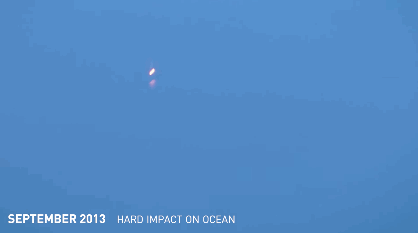”
\] }, { “cell_type”: “markdown”, “metadata”: {}, “source”: \[ “More
specifically, the launch records are stored in a HTML table shown
below:” \] }, { “cell_type”: “markdown”, “metadata”: {}, “source”: \[
“”
\] }, { “cell_type”: “markdown”, “metadata”: {}, “source”: \[ “\##
Objectives”, “”, “Web scrap Falcon 9 launch records with
`BeautifulSoup`:”, “”, “\* Extract a Falcon 9 launch records HTML table
from Wikipedia”, “\* Parse the table and convert it into a Pandas data
frame” \] }, { “cell_type”: “markdown”, “metadata”: {}, “source”: \[
“First let’s import required packages for this lab” \] }, { “cell_type”:
“code”, “execution_count”: null, “metadata”: {}, “outputs”: \[\],
“source”: \[ “!pip3 install beautifulsoup4”, “!pip3 install requests” \]
}, { “cell_type”: “code”, “execution_count”: null, “metadata”: {},
“outputs”: \[\], “source”: \[ “import sys”, “”, “import requests”, “from
bs4 import BeautifulSoup”, “import re”, “import unicodedata”, “import
pandas as pd” \] }, { “cell_type”: “markdown”, “metadata”: {}, “source”:
\[ “and we will provide some helper functions for you to process web
scraped HTML table” \] }, { “cell_type”: “code”, “execution_count”:
null, “metadata”: {}, “outputs”: \[\], “source”: \[ “def
date_time(table_cells):”, ” """“,” This function returns the data and
time from the HTML table cell“,” Input: the element of a table data cell
extracts extra row“,” """“,” return \[data_time.strip() for data_time in
list(table_cells.strings)\]\[0:2\]“,”“,”def
booster_version(table_cells):“,” """“,” This function returns the
booster version from the HTML table cell “,” Input: the element of a
table data cell extracts extra row“,” """“,”
out=’‘.join(\[booster_version for i,booster_version in enumerate(
table_cells.strings) if i%2==0\]\[0:-1\])“,” return out“,”“,”def
landing_status(table_cells):“,” """“,” This function returns the landing
status from the HTML table cell “,” Input: the element of a table data
cell extracts extra row“,” """“,” out=\[i for i in
table_cells.strings\]\[0\]“,” return out“,”“,”“,”def
get_mass(table_cells):“,” mass=unicodedata.normalize("NFKD",
table_cells.text).strip()“,” if mass:“,” mass.find("kg")“,”
new_mass=mass\[0:mass.find("kg")+2\]“,” else:“,” new_mass=0“,” return
new_mass“,”“,”“,”def extract_column_from_header(row):“,” """“,” This
function returns the landing status from the HTML table cell “,” Input:
the element of a table data cell extracts extra row“,” """“,” if
(row.br):“,” row.br.extract()“,” if row.a:“,” row.a.extract()“,” if
row.sup:“,” row.sup.extract()“,” “,” colunm_name =’
’.join(row.contents)“,” “,” \# Filter the digit and empty names“,” if
not(colunm_name.strip().isdigit()):“,” colunm_name =
colunm_name.strip()“,” return colunm_name ” \] }, { “cell_type”:
“markdown”, “metadata”: {}, “source”: \[ “To keep the lab tasks
consistent, you will be asked to scrape the data from a snapshot of the
`List of Falcon 9 and Falcon Heavy launches` Wikipage updated on”,
“`9th June 2021`” \] }, { “cell_type”: “code”, “execution_count”: null,
“metadata”: {}, “outputs”: \[\], “source”: \[ “static_url =
"https://en.wikipedia.org/w/index.php?title=List_of_Falcon_9\_and_Falcon_Heavy_launches&oldid=1027686922"”
\] }, { “cell_type”: “markdown”, “metadata”: {}, “source”: \[ “Next,
request the HTML page from the above URL and get a `response` object” \]
}, { “cell_type”: “markdown”, “metadata”: {}, “source”: \[ “\### TASK 1:
Request the Falcon9 Launch Wiki page from its URL” \] }, { “cell_type”:
“markdown”, “metadata”: {}, “source”: \[ “First, let’s perform an HTTP
GET method to request the Falcon9 Launch HTML page, as an HTTP
response.” \] }, { “cell_type”: “code”, “execution_count”: null,
“metadata”: {}, “outputs”: \[\], “source”: \[ “\# use requests.get()
method with the provided static_url”, “\# assign the response to a
object” \] }, { “cell_type”: “markdown”, “metadata”: {}, “source”: \[
“Create a `BeautifulSoup` object from the HTML `response`” \] }, {
“cell_type”: “code”, “execution_count”: null, “metadata”: {}, “outputs”:
\[\], “source”: \[ “\# Use BeautifulSoup() to create a BeautifulSoup
object from a response text content” \] }, { “cell_type”: “markdown”,
“metadata”: {}, “source”: \[ “Print the page title to verify if the
`BeautifulSoup` object was created properly” \] }, { “cell_type”:
“code”, “execution_count”: null, “metadata”: {}, “outputs”: \[\],
“source”: \[ “\# Use soup.title attribute” \] }, { “cell_type”:
“markdown”, “metadata”: {}, “source”: \[ “\### TASK 2: Extract all
column/variable names from the HTML table header” \] }, { “cell_type”:
“markdown”, “metadata”: {}, “source”: \[ “Next, we want to collect all
relevant column names from the HTML table header” \] }, { “cell_type”:
“markdown”, “metadata”: {}, “source”: \[ “Let’s try to find all tables
on the wiki page first. If you need to refresh your memory about
`BeautifulSoup`, please check the external reference link towards the
end of this lab” \] }, { “cell_type”: “code”, “execution_count”: null,
“metadata”: {}, “outputs”: \[\], “source”: \[ “\# Use the find_all
function in the BeautifulSoup object, with element type `table`”, “\#
Assign the result to a list called `html_tables`” \] }, { “cell_type”:
“markdown”, “metadata”: {}, “source”: \[ “Starting from the third table
is our target table contains the actual launch records.” \] }, {
“cell_type”: “code”, “execution_count”: null, “metadata”: {}, “outputs”:
\[\], “source”: \[ “\# Let’s print the third table and check its
content”, “first_launch_table = html_tables\[2\]”,
“print(first_launch_table)” \] }, { “cell_type”: “markdown”, “metadata”:
{}, “source”: \[ “You should able to see the columns names embedded in
the table header elements `<th>` as follows:” \] }, { “cell_type”:
“markdown”, “metadata”: {}, “source”: \[
“`\n",     "<tr>\n",     "<th scope=\"col\">Flight No.\n",     "</th>\n",     "<th scope=\"col\">Date and<br/>time (<a href=\"/wiki/Coordinated_Universal_Time\" title=\"Coordinated Universal Time\">UTC</a>)\n",     "</th>\n",     "<th scope=\"col\"><a href=\"/wiki/List_of_Falcon_9_first-stage_boosters\" title=\"List of Falcon 9 first-stage boosters\">Version,<br/>Booster</a> <sup class=\"reference\" id=\"cite_ref-booster_11-0\"><a href=\"#cite_note-booster-11\">[b]</a></sup>\n",     "</th>\n",     "<th scope=\"col\">Launch site\n",     "</th>\n",     "<th scope=\"col\">Payload<sup class=\"reference\" id=\"cite_ref-Dragon_12-0\"><a href=\"#cite_note-Dragon-12\">[c]</a></sup>\n",     "</th>\n",     "<th scope=\"col\">Payload mass\n",     "</th>\n",     "<th scope=\"col\">Orbit\n",     "</th>\n",     "<th scope=\"col\">Customer\n",     "</th>\n",     "<th scope=\"col\">Launch<br/>outcome\n",     "</th>\n",     "<th scope=\"col\"><a href=\"/wiki/Falcon_9_first-stage_landing_tests\" title=\"Falcon 9 first-stage landing tests\">Booster<br/>landing</a>\n",     "</th></tr>\n",     "`”
\] }, { “cell_type”: “markdown”, “metadata”: {}, “source”: \[ “Next, we
just need to iterate through the `<th>` elements and apply the provided
`extract_column_from_header()` to extract column name one by one” \] },
{ “cell_type”: “code”, “execution_count”: null, “metadata”: {},
“outputs”: \[\], “source”: \[ “column_names = \[\]”, “”, “\# Apply
find_all() function with `th` element on first_launch_table”, “\#
Iterate each th element and apply the provided
extract_column_from_header() to get a column name”, “\# Append the
Non-empty column name (`if name is not None and len(name) > 0`) into a
list called column_names” \] }, { “cell_type”: “markdown”, “metadata”:
{}, “source”: \[ “Check the extracted column names” \] }, { “cell_type”:
“code”, “execution_count”: null, “metadata”: {}, “outputs”: \[\],
“source”: \[ “print(column_names)” \] }, { “cell_type”: “markdown”,
“metadata”: {}, “source”: \[ “\## TASK 3: Create a data frame by parsing
the launch HTML tables” \] }, { “cell_type”: “markdown”, “metadata”: {},
“source”: \[ “We will create an empty dictionary with keys from the
extracted column names in the previous task. Later, this dictionary will
be converted into a Pandas dataframe” \] }, { “cell_type”: “code”,
“execution_count”: null, “metadata”: {}, “outputs”: \[\], “source”: \[
“launch_dict= dict.fromkeys(column_names)”, “”, “\# Remove an irrelvant
column”, “del launch_dict\[‘Date and time ( )’\]”, “”, “\# Let’s initial
the launch_dict with each value to be an empty list”,
“launch_dict\[‘Flight No.’\] = \[\]”, “launch_dict\[‘Launch site’\] =
\[\]”, “launch_dict\[‘Payload’\] = \[\]”, “launch_dict\[‘Payload mass’\]
= \[\]”, “launch_dict\[‘Orbit’\] = \[\]”, “launch_dict\[‘Customer’\] =
\[\]”, “launch_dict\[‘Launch outcome’\] = \[\]”, “\# Added some new
columns”, “launch_dict\[‘Version Booster’\]=\[\]”,
“launch_dict\[‘Booster landing’\]=\[\]”, “launch_dict\[‘Date’\]=\[\]”,
“launch_dict\[‘Time’\]=\[\]” \] }, { “cell_type”: “markdown”,
“metadata”: {}, “source”: \[ “Next, we just need to fill up the
`launch_dict` with launch records extracted from table rows.” \] }, {
“cell_type”: “markdown”, “metadata”: {}, “source”: \[ “Usually, HTML
tables in Wiki pages are likely to contain unexpected annotations and
other types of noises, such as reference links `B0004.1[8]`, missing
values `N/A [e]`, inconsistent formatting, etc.” \] }, { “cell_type”:
“markdown”, “metadata”: {}, “source”: \[ “To simplify the parsing
process, we have provided an incomplete code snippet below to help you
to fill up the `launch_dict`. Please complete the following code snippet
with TODOs or you can choose to write your own logic to parse all launch
tables:” \] }, { “cell_type”: “code”, “execution_count”: null,
“metadata”: {}, “outputs”: \[\], “source”: \[ “extracted_row = 0”,
“#Extract each table ”, “for table_number,table in
enumerate(soup.find_all(‘table’,"wikitable plainrowheaders
collapsible")):”, ” \# get table row “,” for rows in
table.find_all("tr"):“,” #check to see if first table heading is as
number corresponding to launch a number “,” if rows.th:“,” if
rows.th.string:“,” flight_number=rows.th.string.strip()“,”
flag=flight_number.isdigit()“,” else:“,” flag=False“,” #get table
element “,” row=rows.find_all(‘td’)“,” #if it is number save cells in a
dictonary “,” if flag:“,” extracted_row += 1“,” \# Flight Number
value“,” \# TODO: Append the flight_number into launch_dict with key
`Flight No.`“,” #print(flight_number)“,”
datatimelist=date_time(row\[0\])“,” “,” \# Date value“,” \# TODO: Append
the date into launch_dict with key `Date`“,” date =
datatimelist\[0\].strip(‘,’)“,” #print(date)“,” “,” \# Time value“,” \#
TODO: Append the time into launch_dict with key `Time`“,” time =
datatimelist\[1\]“,” #print(time)“,” “,” \# Booster version“,” \# TODO:
Append the bv into launch_dict with key `Version Booster`“,”
bv=booster_version(row\[1\])“,” if not(bv):“,” bv=row\[1\].a.string“,”
print(bv)“,” “,” \# Launch Site“,” \# TODO: Append the bv into
launch_dict with key `Launch Site`“,” launch_site = row\[2\].a.string“,”
#print(launch_site)“,” “,” \# Payload“,” \# TODO: Append the payload
into launch_dict with key `Payload`“,” payload = row\[3\].a.string“,”
#print(payload)“,” “,” \# Payload Mass“,” \# TODO: Append the
payload_mass into launch_dict with key `Payload mass`“,” payload_mass =
get_mass(row\[4\])“,” #print(payload)“,” “,” \# Orbit“,” \# TODO: Append
the orbit into launch_dict with key `Orbit`“,” orbit =
row\[5\].a.string“,” #print(orbit)“,” “,” \# Customer“,” \# TODO: Append
the customer into launch_dict with key `Customer`“,” customer =
row\[6\].a.string“,” #print(customer)“,” “,” \# Launch outcome“,” \#
TODO: Append the launch_outcome into launch_dict with key
`Launch outcome`“,” launch_outcome = list(row\[7\].strings)\[0\]“,”
#print(launch_outcome)“,” “,” \# Booster landing“,” \# TODO: Append the
launch_outcome into launch_dict with key `Booster landing`“,”
booster_landing = landing_status(row\[8\])“,” #print(booster_landing)“,”
” \] }, { “cell_type”: “markdown”, “metadata”: {}, “source”: \[ “After
you have fill in the parsed launch record values into `launch_dict`, you
can create a dataframe from it.” \] }, { “cell_type”: “code”,
“execution_count”: null, “metadata”: {}, “outputs”: \[\], “source”: \[
“df=pd.DataFrame(launch_dict)” \] }, { “cell_type”: “markdown”,
“metadata”: {}, “source”: \[ “We can now export it to a <b>CSV</b> for
the next section, but to make the answers consistent and in case you
have difficulties finishing this lab.”, “”, “Following labs will be
using a provided dataset to make each lab independent.” \] }, {
“cell_type”: “markdown”, “metadata”: {}, “source”: \[
“<code>df.to_csv(‘spacex_web_scraped.csv’, index=False)</code>” \] }, {
“cell_type”: “markdown”, “metadata”: {}, “source”: \[ “\## Authors” \]
}, { “cell_type”: “markdown”, “metadata”: {}, “source”: \[
“<a href=\"https://www.linkedin.com/in/yan-luo-96288783/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDS0321ENSkillsNetwork26802033-2021-01-01\">Yan
Luo</a>” \] }, { “cell_type”: “markdown”, “metadata”: {}, “source”: \[
“<a href=\"https://www.linkedin.com/in/nayefaboutayoun/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDS0321ENSkillsNetwork26802033-2021-01-01\">Nayef
Abou Tayoun</a>” \] }, { “cell_type”: “markdown”, “metadata”: {},
“source”: \[ “\## Change Log” \] }, { “cell_type”: “markdown”,
“metadata”: {}, “source”: \[ “\| Date (YYYY-MM-DD) \| Version \| Changed
By \| Change Description \|”, “\| —————– \| ——- \| ———- \| —————————
\|”, “\| 2021-06-09 \| 1.0 \| Yan Luo \| Tasks updates \|”, “\|
2020-11-10 \| 1.0 \| Nayef \| Created the initial version \|” \] }, {
“cell_type”: “markdown”, “metadata”: {}, “source”: \[ “Copyright © 2021
IBM Corporation. All rights reserved.” \] } \], “metadata”: {
“kernelspec”: { “display_name”: “Python 3”, “language”: “python”,
“name”: “python3” }, “language_info”: { “codemirror_mode”: { “name”:
“ipython”, “version”: 3 }, “file_extension”: “.py”, “mimetype”:
“text/x-python”, “name”: “python”, “nbconvert_exporter”: “python”,
“pygments_lexer”: “ipython3”, “version”: “3.8.3” } }, “nbformat”: 4,
“nbformat_minor”: 4 }